In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pylab as plt

import astropy.io.fits as fits

import glob

import os

from photutils.aperture import EllipticalAperture
from photutils.aperture import EllipticalAnnulus
from photutils import aperture_photometry

from matplotlib.colors import LogNorm

# Importing fits files for M101:

In [2]:
# filepath just for M101 observations:

filepath = glob.glob('./fits/ARCSAT/M101*.fits')

In [3]:
# getting copies of data and headers for M101; prints filenames as well as headers for first two:

data_array = []
header_array = []

for file in filepath:

    hdu = fits.open(file)
    data_array.append(hdu[0].data.copy())
    header_array.append(hdu[0].header.copy())
    print(os.path.basename(file))

hdu.close()
header_array[0]

M101_halpha_20180519_065831.fits
M101_sdss_g_20180519_061809.fits
M101_sdss_i_20180519_063906.fits
M101_sdss_r_20180519_064852.fits
M101_sdss_u_20180519_053518.fits
M101_sdss_u_20180519_054526.fits
M101_sdss_u_20180519_060125.fits
M101_sdss_z_20180519_062813.fits


SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 4096 /fastest changing axis                           
NAXIS2  =                 4096 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2018-05-19T06:58:45' / [ISO 8601] UTC date/time of exposure start    
EXPTIME =   7.00000000000E+002 / [sec] Duration of exposure                     
EXPOSURE=   7.00000000000E+002 / [sec] Duration of exposure                     
SET-TEMP=  -28.899999618530273 /CCD temperature setpoint in C                   
CCD-TEMP=  -28.826745750000001 /CCD temperature at start of exposure in C       
XPIXSZ  =   9.00000000000000

# Trying to make a quick pretty picture:

In [4]:
plt.style.use('default')

In [5]:
# lazy image reduction:

crude_i = data_array[2]-np.mean(data_array[2])
crude_r = data_array[3]-np.mean(data_array[3])
crude_g = data_array[1]-np.mean(data_array[1])
crude_u = data_array[6]-np.mean(data_array[6])

In [6]:
from astropy.visualization import make_lupton_rgb

In [7]:
color_image = make_lupton_rgb(crude_r, crude_g, crude_u, stretch=800)

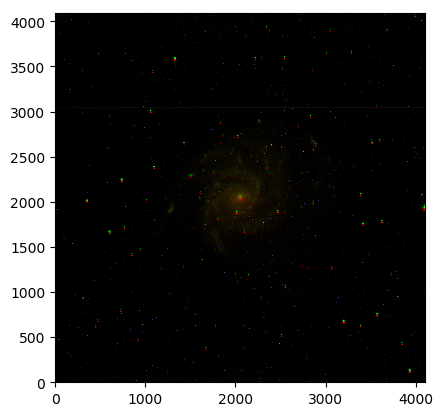

In [8]:
plt.imshow(color_image, norm=LogNorm(vmin=500), origin='lower', cmap='rainbow');

In [9]:
from astropy import stats

In [10]:
clip_star = stats.sigma_clip(data_array[1], sigma=5, iters=5)
clip_color = stats.sigma_clip(color_image, sigma=5, iters=5)

In [11]:
copy_data = np.copy(data_array[1])
color_copy = np.copy(color_image)

copy_data[~clip_star.mask] = data_array[1].min()
color_copy[~clip_color.mask] = color_image.min()

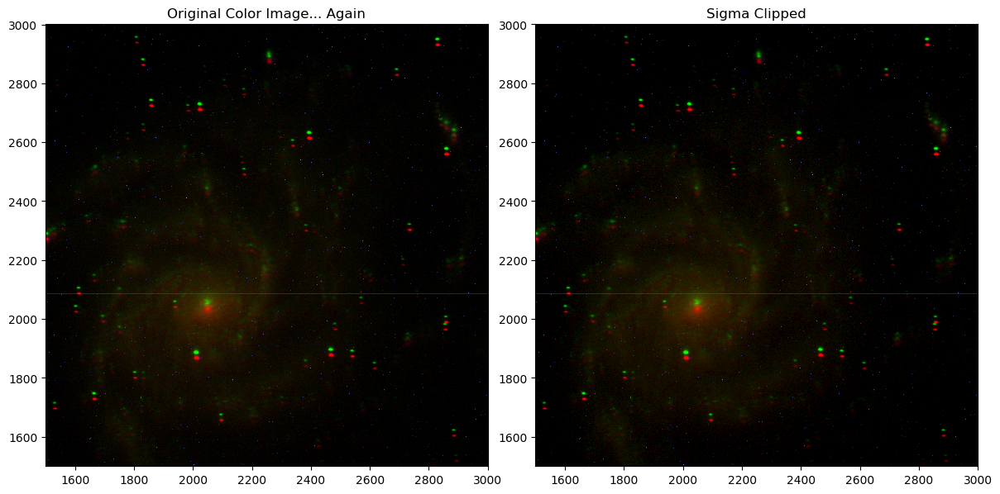

In [12]:
fig, ax = plt.subplots(1,2)

fig.set_size_inches(12,6)

fig.tight_layout()

ax[0].axis((1500,3000,1500,3000))
ax[1].axis((1500,3000,1500,3000))

ax[0].imshow(color_image, norm=LogNorm(vmin=200), origin='lower', cmap='rainbow')
ax[1].imshow(color_copy, norm=LogNorm(vmin=200), origin='lower', cmap='rainbow')
ax[0].set_title('Original Color Image... Again')
ax[1].set_title('Sigma Clipped');

# Okay now to actually import the biases and flats:

In [13]:
# Night 1 Bias Filepath:

filepath2 = glob.glob('./fits/ARCSAT/Bias*.fits')

In [14]:
# Retrieves night 1 bias stuff; prints filenames & returns avg. bias count.

biasdata_array = []
biasheader_array = []
bias_avgs = []
superbias = []

for file in filepath2:

    hdu1 = fits.open(file)
    biasdata_array.append(hdu1[0].data.copy())
    biasheader_array.append(hdu1[0].header.copy())
    print(os.path.basename(file))
    bdata = fits.getdata(file)
    bias_avgs.append(np.mean(bdata))

super_bias = np.mean(bias_avgs)

hdu1.close()
print(super_bias)

Bias_BIN1_20180519_015217.fits
Bias_BIN1_20180519_015240.fits
Bias_BIN1_20180519_015302.fits
Bias_BIN1_20180519_015326.fits
Bias_BIN1_20180519_015349.fits
Bias_BIN1_20180519_015412.fits
Bias_BIN1_20180519_015434.fits
Bias_BIN1_20180519_015458.fits
Bias_BIN1_20180519_015521.fits
Bias_BIN1_20180519_015545.fits
Bias_BIN1_20180519_015608.fits
Bias_BIN1_20180519_015632.fits
1132.7215329160292


In [15]:
# Filepath for night 1 dome flats.

filepath3 = glob.glob('./fits/ARCSAT/domeflat*.fits')

In [16]:
# Getting dome flat stuff:

domeflatdata_array = []
domeflatheader_array = []

for file in filepath3:

    hdu2 = fits.open(file)
    domeflatdata_array.append(hdu2[0].data.copy())
    domeflatheader_array.append(hdu2[0].header.copy())
    print(os.path.basename(file))

hdu2.close()

domeflat_halpha_001.fits
domeflat_sdss_g_001.fits
domeflat_sdss_i_001.fits
domeflat_sdss_i_002.fits
domeflat_sdss_i_003.fits
domeflat_sdss_r_001.fits
domeflat_sdss_r_002.fits
domeflat_sdss_r_003.fits
domeflat_sdss_z_001.fits


In [17]:
# sdss_i avg. flat count (just for the hell of it):

iflat_avg = np.mean(domeflatdata_array[2:5])
print(iflat_avg)

19477.48177142938


# Now for actual data reduction (of M101):

In [18]:
# subtract biases - from everything,
# divide flats

In [19]:
from sklearn.preprocessing import normalize

In [20]:
# making average i band flat:

i_avg_flats = (domeflatdata_array[2] + domeflatdata_array[3] + domeflatdata_array[4])/3

In [21]:
i_avg_flats_minusbias = i_avg_flats - super_bias

In [22]:
# normalizing i band flat:

n1_domeflatnorm_i = i_avg_flats_minusbias/np.linalg.norm(i_avg_flats_minusbias)

In [23]:
reduced_i_M101 = (data_array[2] - super_bias)/(n1_domeflatnorm_i)

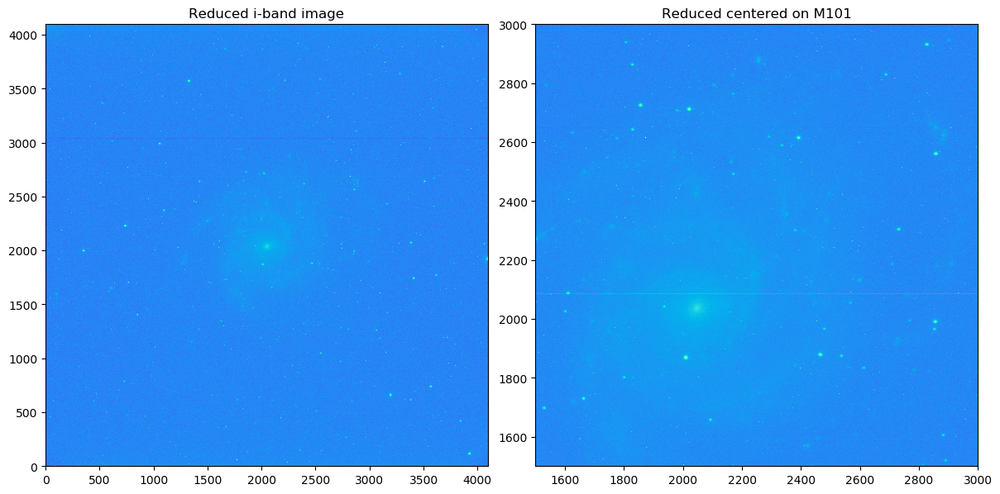

In [24]:
fig, ax = plt.subplots(1,2)

fig.set_size_inches(12,6)

fig.tight_layout()

ax[1].axis((1500,3000,1500,3000))

ax[0].imshow(reduced_i_M101, norm=LogNorm(), origin='lower', cmap='rainbow')
ax[1].imshow(reduced_i_M101, norm=LogNorm(), origin='lower', cmap='rainbow')

ax[0].set_title('Reduced i-band image')
ax[1].set_title('Reduced centered on M101');

In [25]:
# Guess I should just write another loop here...ah well.

In [26]:
r_avg_flats = (domeflatdata_array[5] + domeflatdata_array[6] + domeflatdata_array[7])/3

In [27]:
rflat_minusbias = r_avg_flats - super_bias

In [28]:
n1_domeflatnorm_r = rflat_minusbias/np.linalg.norm(rflat_minusbias)

In [29]:
reduced_r_M101 = (data_array[3] - super_bias)/(n1_domeflatnorm_r)

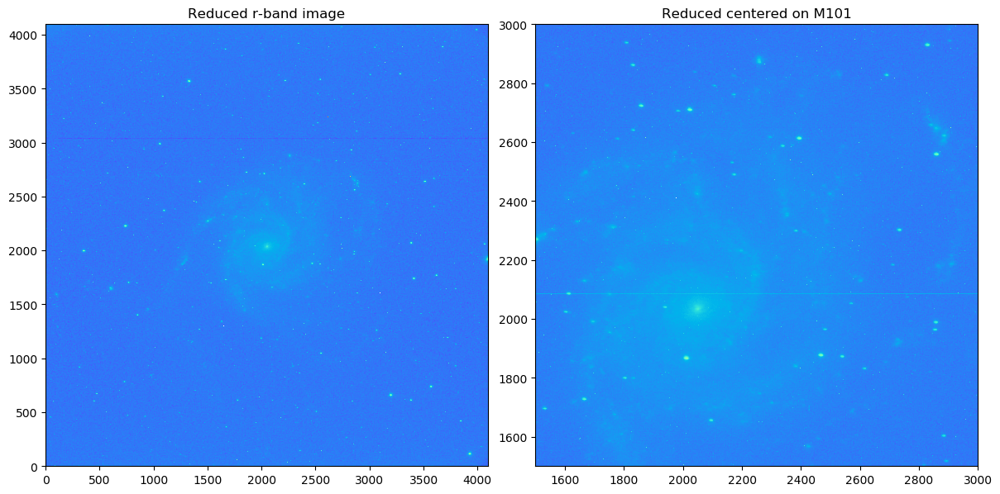

In [30]:
fig, ax = plt.subplots(1,2)

fig.set_size_inches(12,6)

fig.tight_layout()

ax[1].axis((1500,3000,1500,3000))

ax[0].imshow(reduced_r_M101, norm=LogNorm(), origin='lower', cmap='rainbow')
ax[1].imshow(reduced_r_M101, norm=LogNorm(), origin='lower', cmap='rainbow')

ax[0].set_title('Reduced r-band image')
ax[1].set_title('Reduced centered on M101');

In [31]:
# g band

g_avg_flats_minusbias = domeflatdata_array[1] - super_bias

n1_domeflatnorm_g = g_avg_flats_minusbias/np.linalg.norm(g_avg_flats_minusbias)

reduced_g_M101 = (data_array[3] - super_bias)/(n1_domeflatnorm_g)

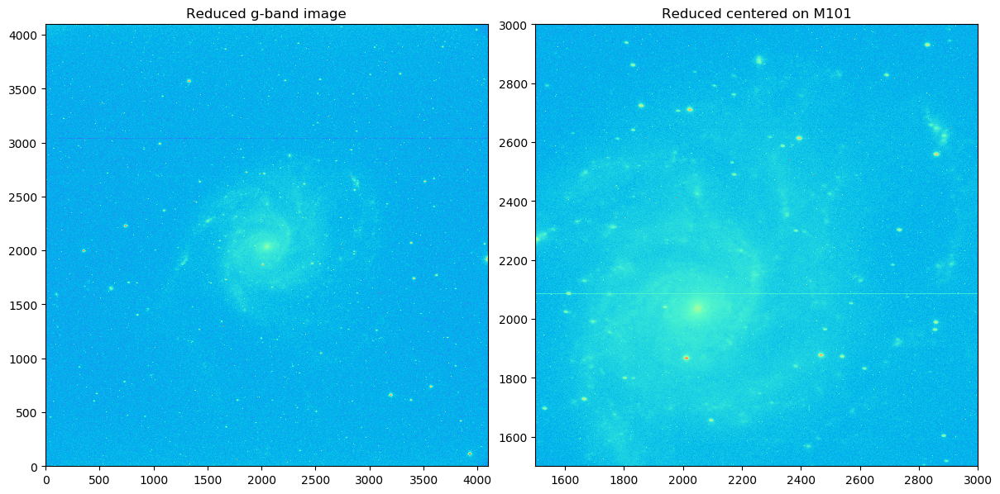

In [32]:
fig, ax = plt.subplots(1,2)

fig.set_size_inches(12,6)

fig.tight_layout()

ax[1].axis((1500,3000,1500,3000))

ax[0].imshow(reduced_g_M101, norm=LogNorm(), origin='lower', cmap='rainbow')
ax[1].imshow(reduced_g_M101, norm=LogNorm(), origin='lower', cmap='rainbow')

ax[0].set_title('Reduced g-band image')
ax[1].set_title('Reduced centered on M101');

In [34]:
# z band

z_avg_flats_minusbias = domeflatdata_array[-1] - super_bias

n1_domeflatnorm_z = z_avg_flats_minusbias/np.linalg.norm(z_avg_flats_minusbias)

reduced_z_M101 = (data_array[7] - super_bias)/(n1_domeflatnorm_z)

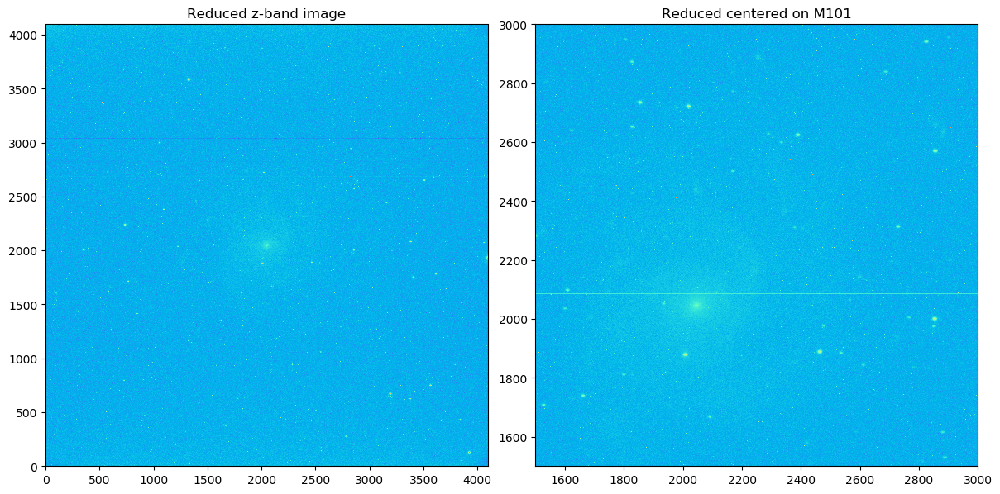

In [35]:
fig, ax = plt.subplots(1,2)

fig.set_size_inches(12,6)

fig.tight_layout()

ax[1].axis((1500,3000,1500,3000))

ax[0].imshow(reduced_z_M101, norm=LogNorm(), origin='lower', cmap='rainbow')
ax[1].imshow(reduced_z_M101, norm=LogNorm(), origin='lower', cmap='rainbow')

ax[0].set_title('Reduced z-band image')
ax[1].set_title('Reduced centered on M101');

In [36]:
# H alpha narrowband

halpha_avg_flats_minusbias = domeflatdata_array[0] - super_bias

n1_domeflatnorm_halpha = halpha_avg_flats_minusbias/np.linalg.norm(halpha_avg_flats_minusbias)

reduced_halpha_M101 = (data_array[0] - super_bias)/(n1_domeflatnorm_halpha)

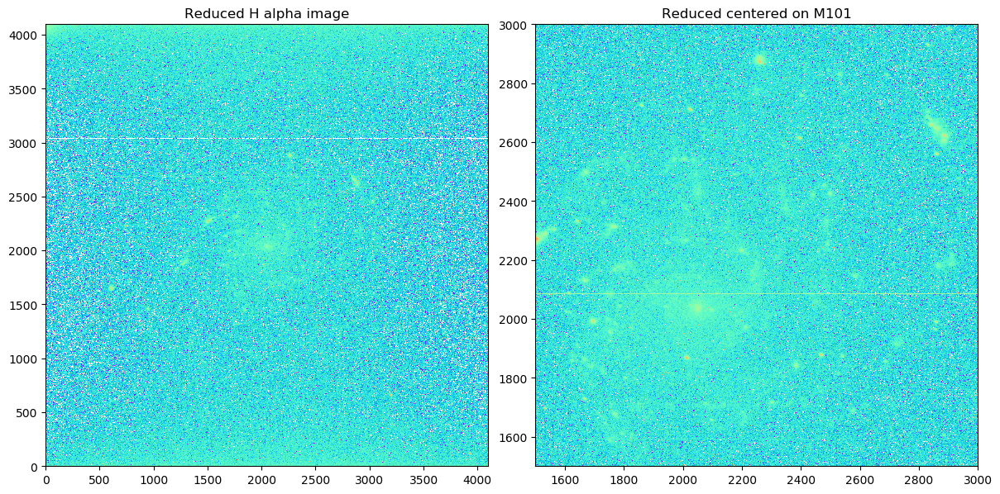

In [59]:
fig, ax = plt.subplots(1,2)

fig.set_size_inches(12,6)

fig.tight_layout()

ax[1].axis((1500,3000,1500,3000))

ax[0].imshow(reduced_halpha_M101, norm=LogNorm(), origin='lower', cmap='rainbow')
ax[1].imshow(reduced_halpha_M101, norm=LogNorm(), origin='lower', cmap='rainbow')

ax[0].set_title('Reduced H alpha image')
ax[1].set_title('Reduced centered on M101');

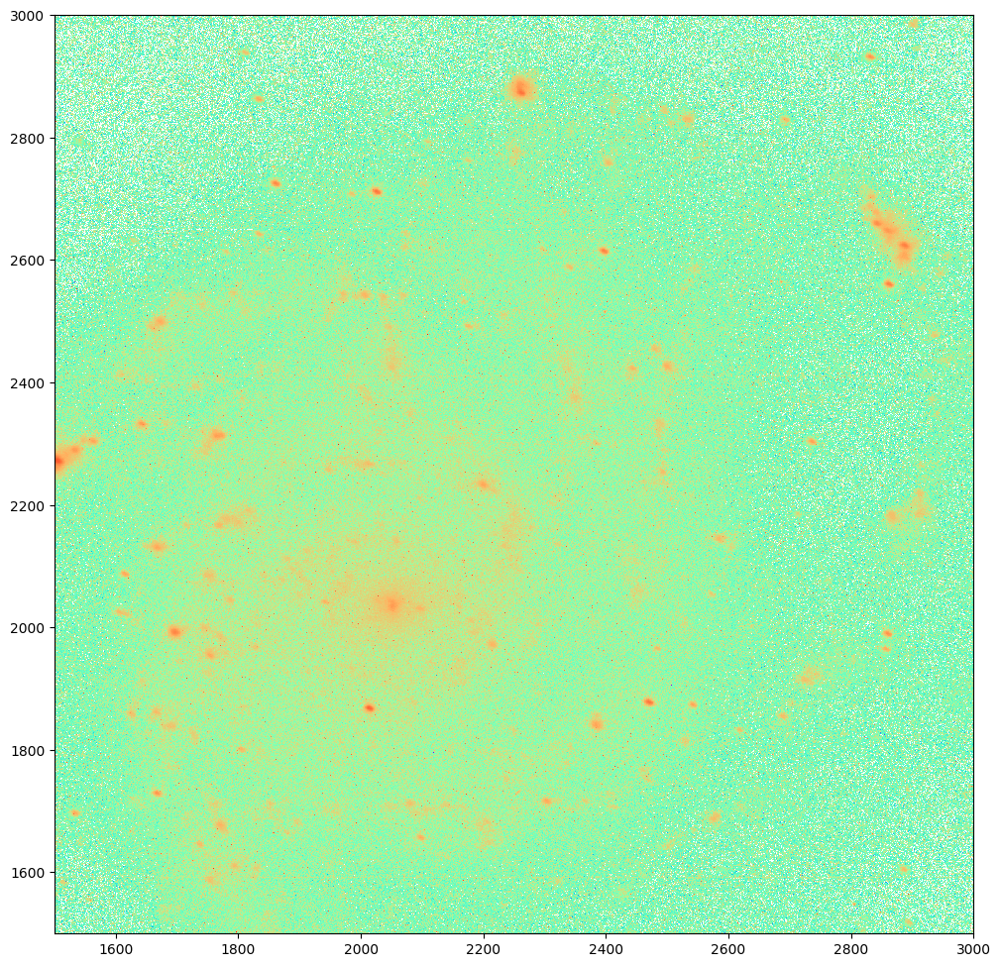

In [60]:
# look at those pockets of star formation...

fig,ax = plt.subplots(1,1)

fig.set_size_inches(10,10)
fig.tight_layout()

ax.axis((1500,3000,1500,3000))

ax.imshow(reduced_g_M101-np.mean(reduced_g_M101), norm=LogNorm(), cmap='rainbow')
ax.imshow(reduced_r_M101-np.mean(reduced_z_M101), norm=LogNorm(), cmap='rainbow')
ax.imshow(reduced_halpha_M101-np.mean(reduced_halpha_M101), norm=LogNorm(), cmap='rainbow');

# Now for sky-subtraction:

In [38]:
coord = [2051.134, 2053.268]

In [39]:
ApertureScience = EllipticalAperture(coord, a=850, b=700, theta=(np.pi/4))

In [40]:
ap_pho = aperture_photometry(reduced_g_M101, ApertureScience, method='exact')
ap_pho

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,2051.134,2053.268,873119312051.6527


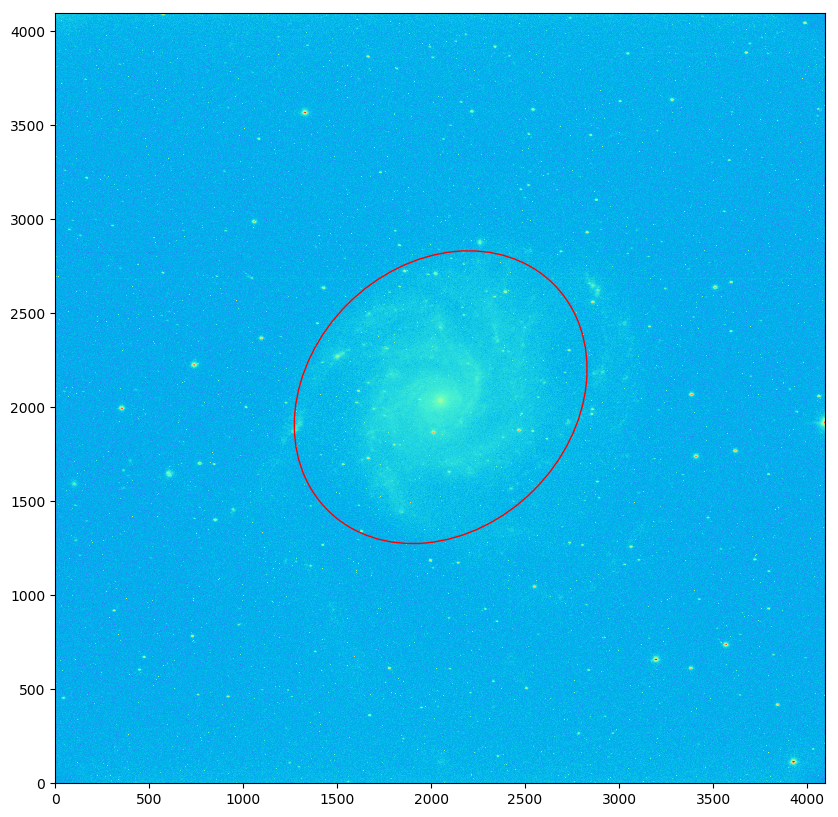

In [41]:
fig,ax = plt.subplots(1,1)                 
fig.set_size_inches(10,10)
fig.set_tight_layout

plt.imshow(reduced_g_M101, norm=LogNorm(), alpha=1.0, cmap='rainbow', origin='lower')
EllipticalAperture.plot(ApertureScience, color="r");

In [42]:
count = []

count_a = ap_pho['aperture_sum']
count_per_area = (count_a / (ApertureScience.area())) # counts / pixel squared
count.append(count_per_area)
print(count)

[<Column name='aperture_sum' dtype='float64' length=1>
467096.6535193802]


In [43]:
# That can't be right.

In [44]:
coord2 = [3318.906, 1504.755]

In [45]:
Elliptical_Annulus_Science = EllipticalAnnulus(coord2, a_in=.1, a_out=.2, b_out=.1, theta=0)

In [61]:
ell_ann_phot = aperture_photometry(reduced_g_M101, Elliptical_Annulus_Science, method='exact')
print(ell_ann_phot, Elliptical_Annulus_Science.area()) # no...

 id xcenter  ycenter     aperture_sum  
      pix      pix                     
--- -------- -------- -----------------
  1 3318.906 1504.755 12687.15426025583 0.04712388980384691
